In [1]:
import glob

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
np.random.seed(100)
%matplotlib inline
# %config InlineBackend.figure_format = 'retina'

import matplotlib as mpl
mpl.rcParams['figure.facecolor'] = (1,1,1,1)
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42

pd.set_option('display.max_columns', 80)

import scipy.stats as stats

In /home/yyasumizu/anaconda3/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The text.latex.preview rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /home/yyasumizu/anaconda3/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The mathtext.fallback_to_cm rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /home/yyasumizu/anaconda3/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: Support for setting the 'mathtext.fallback_to_cm' rcParam is deprecated since 3.3 and will be removed two minor releases later; use 'mathtext.fallback : 'cm' instead.
In /home/yyasumizu/anaconda3/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The validate_bool_maybe_none function was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /home/yyasumizu/anaconda3/lib/python3.7/site-

In [2]:
from skimage import io
from skimage.color import hed2rgb, rgb2hed
from skimage import data

In [3]:
ihc_rgb = io.imread('./data/KRT6_x10/MG/H1801683-1.tif')
# ihc_rgb = io.imread('./data/KRT6_x10/MG/H1704043_1.tif')
# ihc_rgb = io.imread('./data/KRT6_x10/MG/H189399-2.tif')
# ihc_rgb = io.imread('./data/KRT6_x10/nonMG/H1709503-1.tif')
# ihc_rgb = io.imread('./data/KRT6_x10/nonMG/H1809579-1.tif')

# ihc_rgb = io.imread('./data/KRT6_x10/MG/H1912375-5.tif')

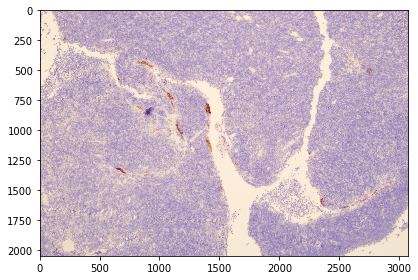

In [4]:
io.imshow(ihc_rgb)

In [5]:
import cv2 as cv
def white_balance(img):
    result = cv.cvtColor(img, cv.COLOR_BGR2LAB)
    avg_a = np.average(result[:, :, 1])
    avg_b = np.average(result[:, :, 2])
    result[:, :, 1] = result[:, :, 1] - ((avg_a - 128) * (result[:, :, 0] / 255.0) * 1.1)
    result[:, :, 2] = result[:, :, 2] - ((avg_b - 128) * (result[:, :, 0] / 255.0) * 1.1)
    result = cv.cvtColor(result, cv.COLOR_LAB2BGR)
    return result

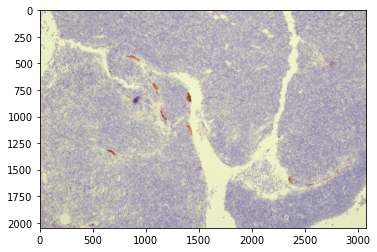

In [6]:
plt.imshow(white_balance(ihc_rgb))

In [7]:
ihc_rgb = white_balance(ihc_rgb)

In [8]:
ihc_hed = rgb2hed(ihc_rgb)

# Create an RGB image for each of the stains
null = np.zeros_like(ihc_hed[:, :, 0])
ihc_h = hed2rgb(np.stack((ihc_hed[:, :, 0], null, null), axis=-1))
ihc_e = hed2rgb(np.stack((null, ihc_hed[:, :, 1], null), axis=-1))
ihc_d = hed2rgb(np.stack((null, null, ihc_hed[:, :, 2]), axis=-1))

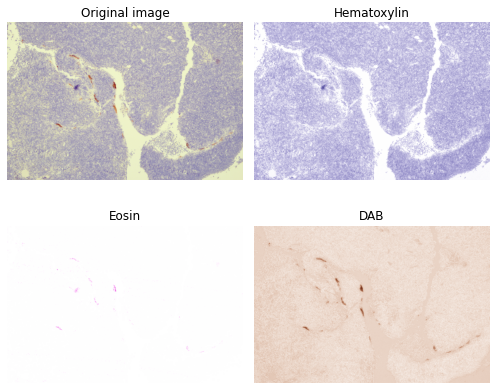

In [9]:
# Display
fig, axes = plt.subplots(2, 2, figsize=(7, 6), sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(ihc_rgb)
ax[0].set_title("Original image")

ax[1].imshow(ihc_h)
ax[1].set_title("Hematoxylin")

ax[2].imshow(ihc_e)
ax[2].set_title("Eosin")  # Note that there is no Eosin stain in this image

ax[3].imshow(ihc_d)
ax[3].set_title("DAB")

for a in ax.ravel():
    a.axis('off')

fig.tight_layout()

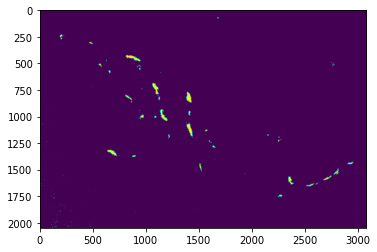

In [10]:
plt.imshow(ihc_hed[:, :, 2] > 0.04)

In [11]:
(ihc_hed[:, :, 2] > 0.025).sum()

1299727

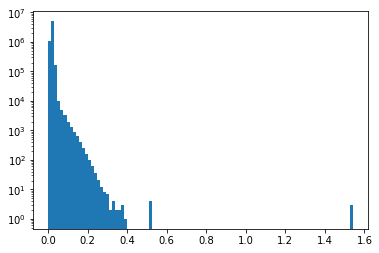

In [12]:
plt.hist(ihc_hed[:, :, 2].flatten(), bins=100)
plt.yscale('log')

## batch processing

## KRT6

In [13]:
threshold = 0.04
dir_base = './data/KRT6_x10/'

In [14]:
f_MG = glob.glob(dir_base+'/MG/*tif')
f_nonMG = glob.glob(dir_base+'/nonMG/*tif')

img_MG = [io.imread(f) for f in f_MG]
img_nonMG = [io.imread(f) for f in f_nonMG]

# img_MG_dab = [rgb2hed(img)[:,:,2] for img in img_MG]
# img_nonMG_dab = [rgb2hed(img)[:,:,2] for img in img_nonMG]

img_MG_dab = [rgb2hed(white_balance(img))[:,:,2] for img in img_MG]
img_nonMG_dab = [rgb2hed(white_balance(img))[:,:,2] for img in img_nonMG]

q_MG = [(x > threshold).sum() for x in img_MG_dab]
q_nonMG = [(x > threshold).sum() for x in img_nonMG_dab]

In [15]:
df_q = pd.DataFrame(q_MG + q_nonMG, columns = ['value'])
df_q['log10value'] = np.log10(df_q['value'] + 1)
df_q['status'] = ['MG' for _ in q_MG] + ['nonMG' for _ in q_nonMG]

<AxesSubplot:xlabel='status', ylabel='value'>

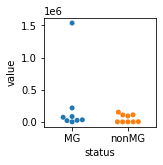

In [16]:
plt.figure(figsize=(2,2))
sns.swarmplot(data=df_q, x='status', y='value')

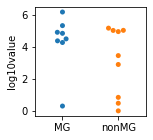

In [17]:
plt.figure(figsize=(2,2))
sns.swarmplot(data=df_q, x='status', y='log10value')
plt.xlabel(None)
plt.savefig('img/krt/log10krt6.pdf', bbox_inches='tight')

In [18]:
stats.mannwhitneyu(df_q.loc[df_q['status']=='MG', 'log10value'], 
               df_q.loc[df_q['status']=='nonMG', 'log10value'])

MannwhitneyuResult(statistic=28.0, pvalue=0.23524321102939483)

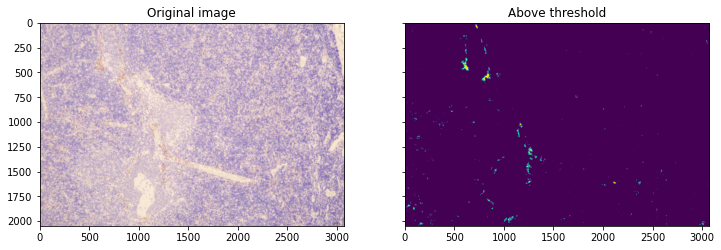

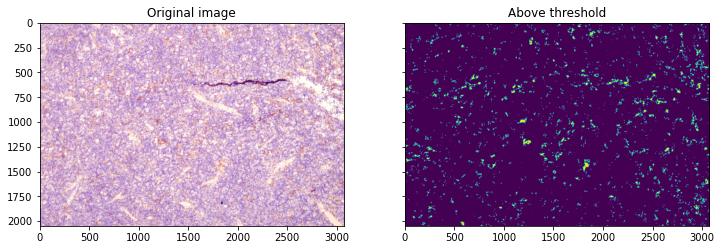

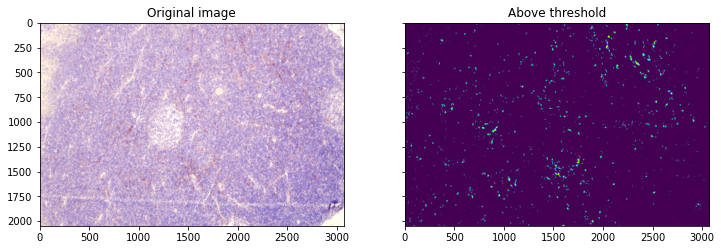

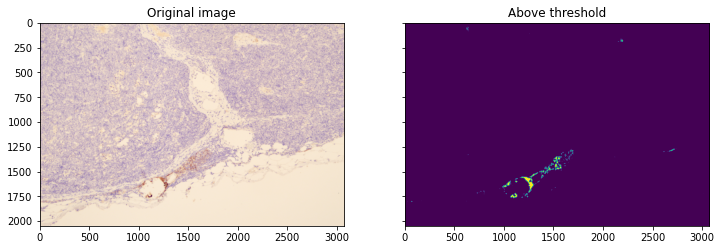

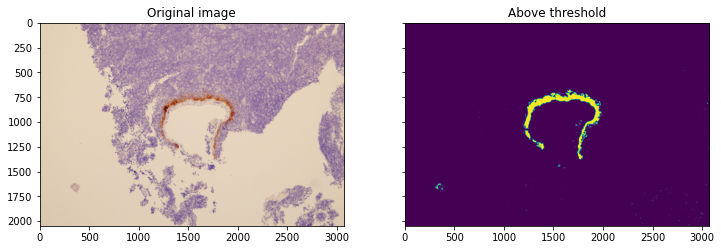

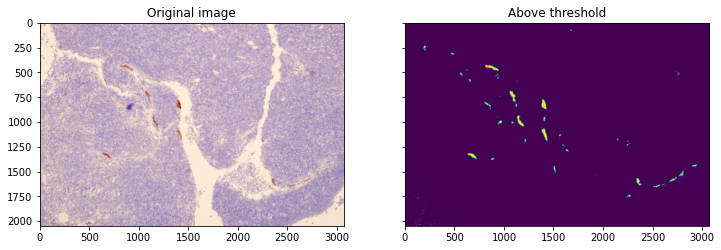

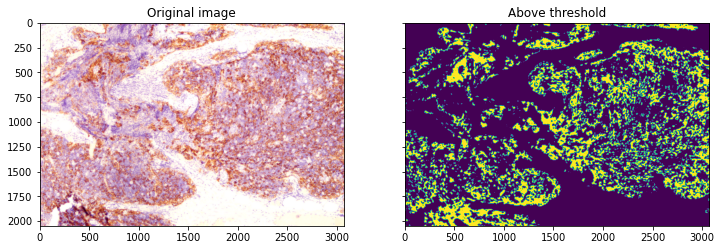

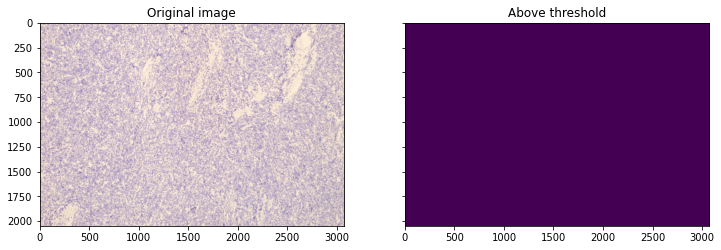

In [19]:
for img, img_d, f in zip(img_MG, img_MG_dab, f_MG):
    fig, axes = plt.subplots(1, 2, figsize=(12, 6), sharex=True, sharey=True)
    ax = axes.ravel()

    ax[0].imshow(img)
    ax[0].set_title("Original image")

    ax[1].imshow(img_d > threshold)
    ax[1].set_title("Above threshold")

    plt.savefig('img/krt/segmentation/KRT6_{}.png'.format(f.split('/')[-1].split('.')[0]), bbox_inches='tight')

In [20]:
f.split('/')[-1].split('.')[0]

'H2003027-1'

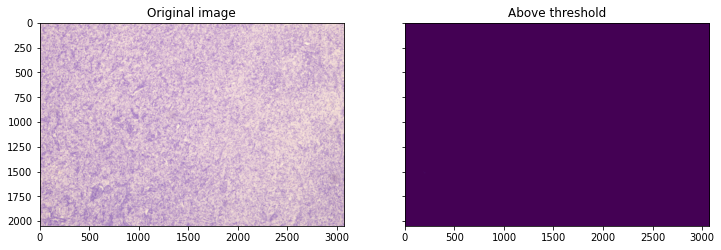

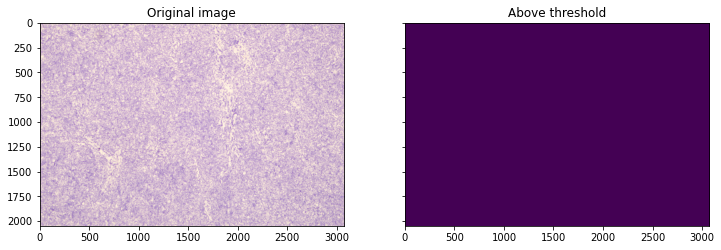

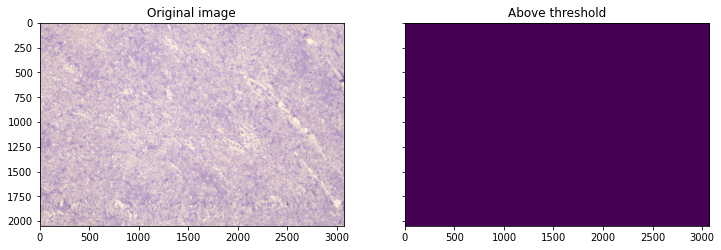

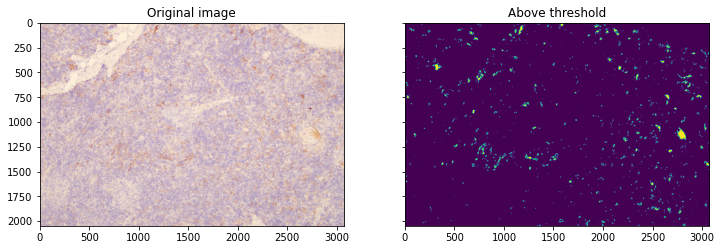

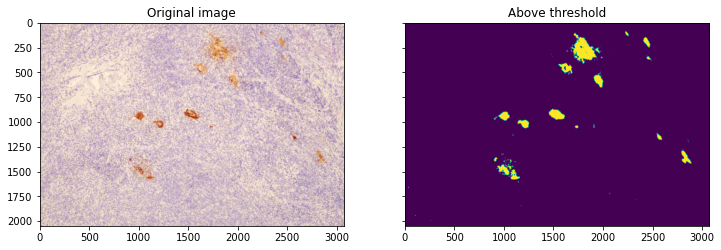

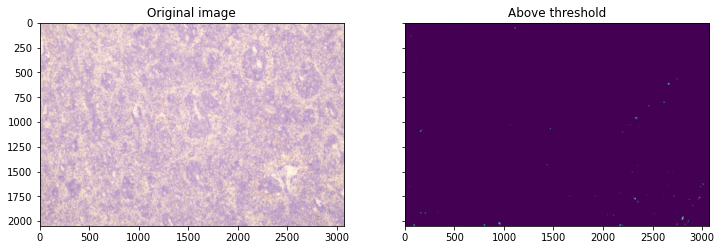

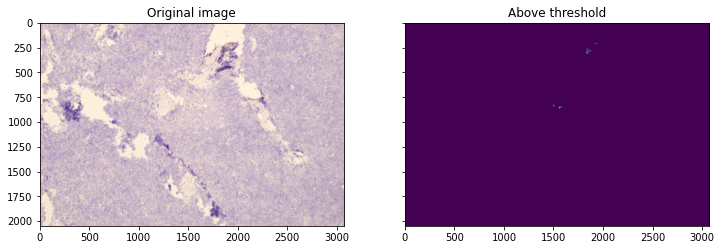

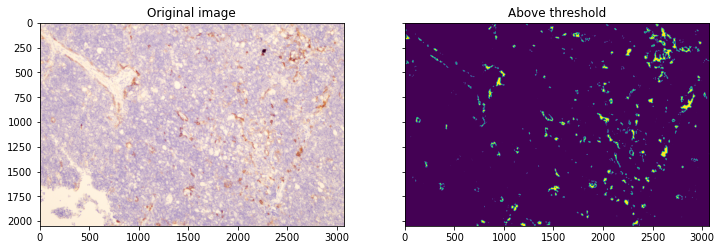

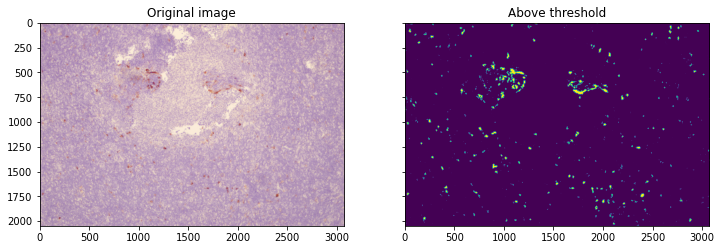

In [21]:
for img, img_d,f in zip(img_nonMG, img_nonMG_dab, f_nonMG):
    fig, axes = plt.subplots(1, 2, figsize=(12, 6), sharex=True, sharey=True)
    ax = axes.ravel()

    ax[0].imshow(img)
    ax[0].set_title("Original image")

    ax[1].imshow(img_d > threshold)
    ax[1].set_title("Above threshold")

    plt.savefig('img/krt/segmentation/KRT6_{}.png'.format(f.split('/')[-1].split('.')[0]), bbox_inches='tight')

In [22]:
df_q_krt6 = df_q

## KRT17

In [23]:
threshold = 0.04
dir_base = './data/KRT17_x10/'

In [24]:
f_MG = glob.glob(dir_base+'/MG/*tif')
f_nonMG = glob.glob(dir_base+'/nonMG/*tif')

img_MG = [io.imread(f) for f in f_MG]
img_nonMG = [io.imread(f) for f in f_nonMG]

# img_MG_dab = [rgb2hed(img)[:,:,2] for img in img_MG]
# img_nonMG_dab = [rgb2hed(img)[:,:,2] for img in img_nonMG]

img_MG_dab = [rgb2hed(white_balance(img))[:,:,2] for img in img_MG]
img_nonMG_dab = [rgb2hed(white_balance(img))[:,:,2] for img in img_nonMG]

q_MG = [(x > threshold).sum() for x in img_MG_dab]
q_nonMG = [(x > threshold).sum() for x in img_nonMG_dab]

In [25]:
df_q = pd.DataFrame(q_MG + q_nonMG, columns = ['value'])
df_q['log10value'] = np.log10(df_q['value'] + 1)
df_q['status'] = ['MG' for _ in q_MG] + ['nonMG' for _ in q_nonMG]

<AxesSubplot:xlabel='status', ylabel='value'>

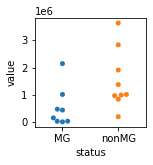

In [26]:
plt.figure(figsize=(2,2))
sns.swarmplot(data=df_q, x='status', y='value')

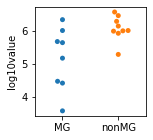

In [27]:
plt.figure(figsize=(2,2))
sns.swarmplot(data=df_q, x='status', y='log10value')
plt.xlabel(None)
plt.savefig('img/krt/log10krt17.pdf', bbox_inches='tight')

In [28]:
stats.mannwhitneyu(df_q.loc[df_q['status']=='MG', 'log10value'], 
               df_q.loc[df_q['status']=='nonMG', 'log10value'])

MannwhitneyuResult(statistic=14.0, pvalue=0.0192806237987123)

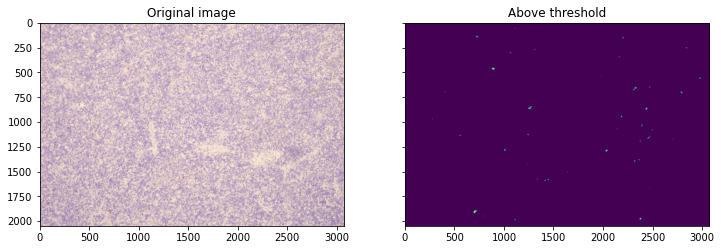

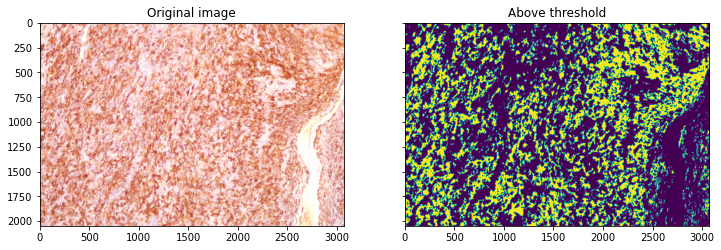

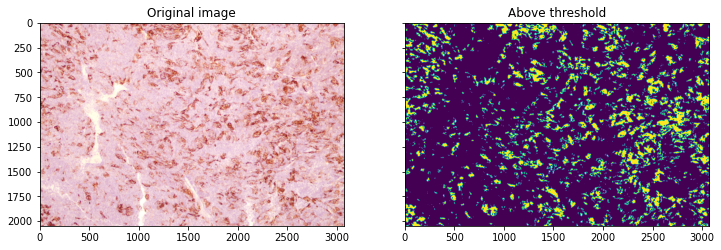

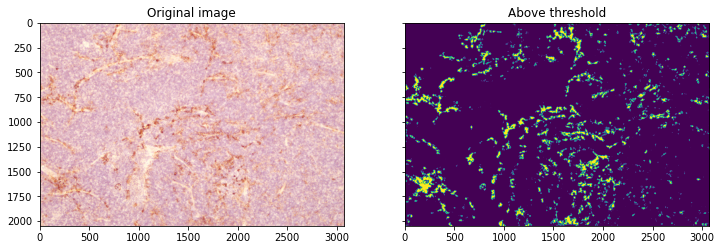

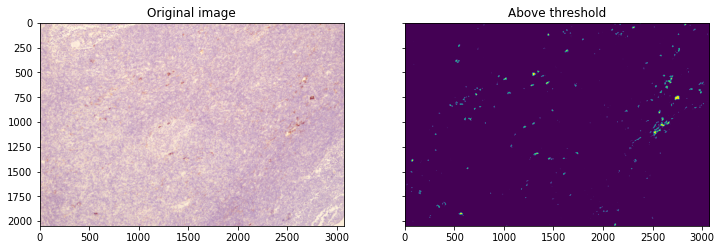

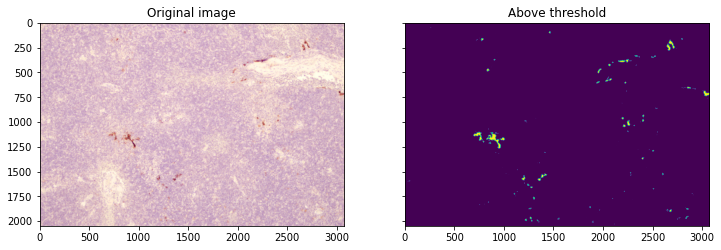

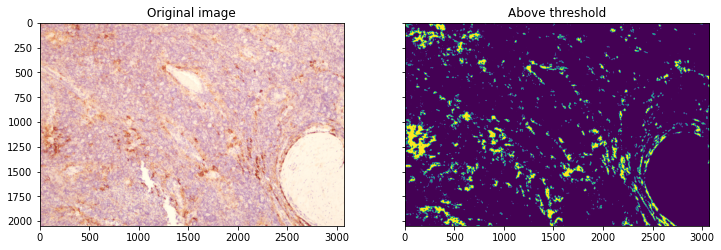

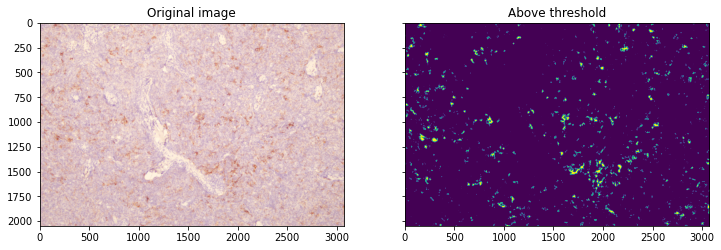

In [29]:
for img, img_d, f in zip(img_MG, img_MG_dab, f_MG):
    fig, axes = plt.subplots(1, 2, figsize=(12, 6), sharex=True, sharey=True)
    ax = axes.ravel()

    ax[0].imshow(img)
    ax[0].set_title("Original image")

    ax[1].imshow(img_d > threshold)
    ax[1].set_title("Above threshold")
    
    plt.savefig('img/krt/segmentation/KRT17_{}.png'.format(f.split('/')[-1].split('.')[0]), bbox_inches='tight')

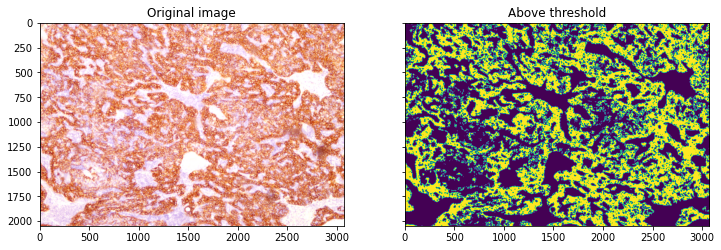

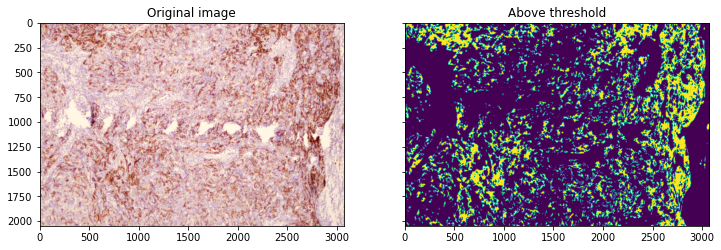

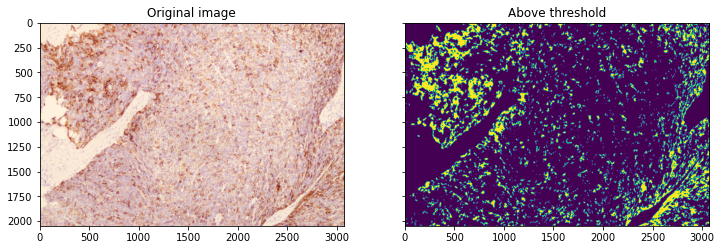

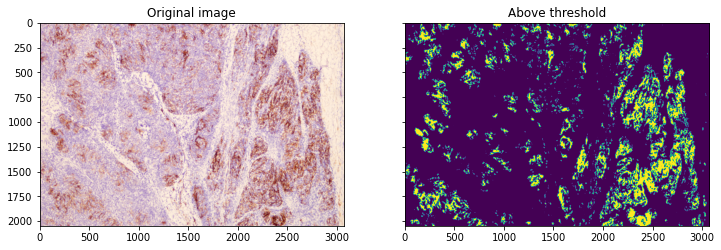

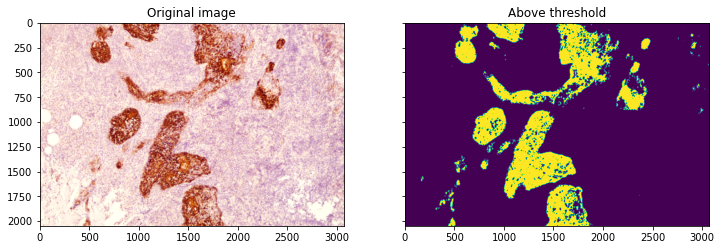

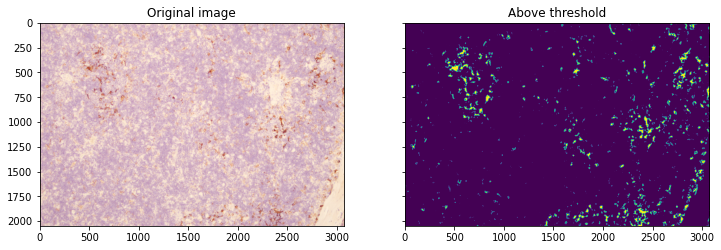

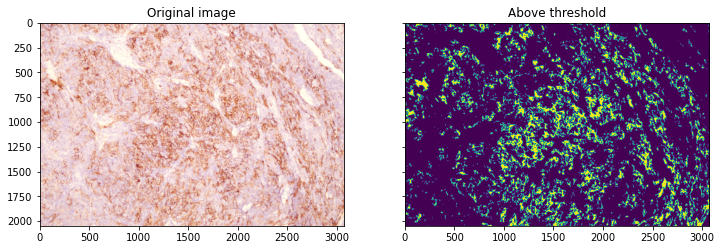

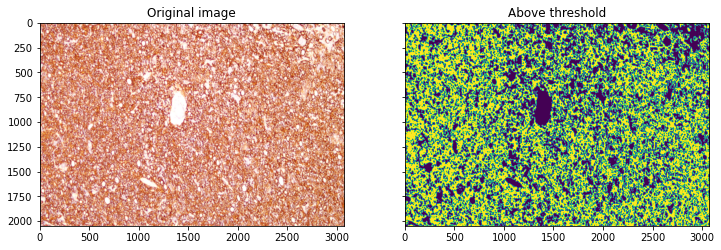

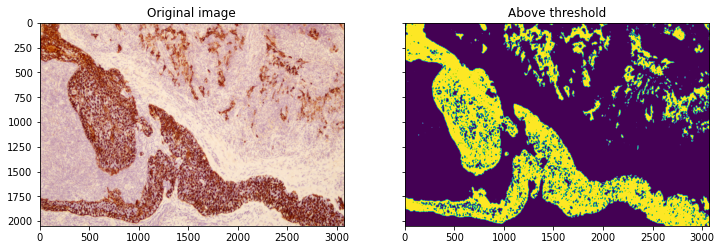

In [30]:
for img, img_d, f in zip(img_nonMG, img_nonMG_dab, f_nonMG):
    fig, axes = plt.subplots(1, 2, figsize=(12, 6), sharex=True, sharey=True)
    ax = axes.ravel()

    ax[0].imshow(img)
    ax[0].set_title("Original image")

    ax[1].imshow(img_d > threshold)
    ax[1].set_title("Above threshold")

    plt.savefig('img/krt/segmentation/KRT17_{}.png'.format(f.split('/')[-1].split('.')[0]), bbox_inches='tight')

In [31]:
df_q_krt17 = df_q

## integrate

In [32]:
df_q_krt6.columns = ['KRT6', 'log10KRT6', 'status']

In [33]:
df_q_krt17.columns = ['KRT17', 'log10KRT17', 'status']

In [34]:
df_q = pd.concat([df_q_krt6.drop('status', axis=1), df_q_krt17], axis=1)

In [35]:
df_q['KRT6/KRT17'] = df_q['KRT6'] / df_q['KRT17']
df_q['log10KRT6/KRT17'] = np.log10(df_q['KRT6/KRT17'] + 1)

<AxesSubplot:xlabel='status', ylabel='KRT6/KRT17'>

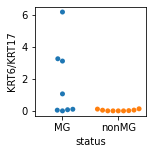

In [36]:
plt.figure(figsize=(2,2))
sns.swarmplot(data=df_q, x='status', y='KRT6/KRT17')

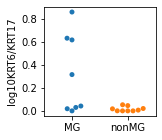

In [37]:
plt.figure(figsize=(2,2))
sns.swarmplot(data=df_q, x='status', y='log10KRT6/KRT17')
plt.xlabel("")
plt.savefig('img/krt/log10krt617.pdf', bbox_inches='tight')

In [38]:
stats.mannwhitneyu(df_q.loc[df_q['status']=='MG', 'log10KRT6/KRT17'], 
               df_q.loc[df_q['status']=='nonMG', 'log10KRT6/KRT17'])

MannwhitneyuResult(statistic=13.0, pvalue=0.01519141098828875)